In [1]:
import glob
import os
import tempfile
import warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from datetime import datetime
from datetime import timedelta
from metpy.plots import USCOUNTIES

from math import atan2 as atan2
from datetime import datetime

from metpy.plots import USCOUNTIES
from metpy.calc import dewpoint_from_relative_humidity
from metpy.units import units
from matplotlib.dates import DateFormatter, date2num
import imageio
import pyart
import nexradaws
import numpy.linalg as la

import sage_data_client

templocation = tempfile.mkdtemp()

warnings.filterwarnings("ignore")

import os

import matplotlib.pyplot as plt

import act

from siphon.catalog import TDSCatalog
from datetime import datetime
import matplotlib.lines as mlines


## You are using the Python ARM Radar Toolkit (Py-ART), an open source
## library for working with weather radar data. Py-ART is partly
## supported by the U.S. Department of Energy as part of the Atmospheric
## Radiation Measurement (ARM) Climate Research Facility, an Office of
## Science user facility.
##
## If you use this software to prepare a publication, please cite:
##
##     JJ Helmus and SM Collis, JORS 2016, doi: 10.5334/jors.119



In [2]:
## Creating timelapse of 26 June air quality event
token = "D7EB47D8-30DA-4E6C-AB31-3EAB5C2E78D3"
if token is not None and len(token) > 0:
    # This first example will get the forcasted values for the date passed
    # at stations within 100 miles of the Zipcode. Can also use latlon instead as
    # results = act.discovery.get_airnow_forecast(token, '2022-05-01', distance=100,
    #                                             latlon=[41.958, -88.12])
    # If the username and token are not set, use the existing sample file
    results = act.discovery.get_airnow_forecast(token, '2022-05-01', zipcode=60439, distance=100)

    # The results show a dataset with air quality information from Oklahoma City
    # The data is not indexed by time and just a rudimentary xarray object from
    # converted from a pandas DataFrame.  Note that the AirNow API labels the data
    # returned as AQI.
    # print(results)
    print(type(results))

    # This call gives the daily average for Ozone, PM2.5 and PM10
    results = act.discovery.get_airnow_obs(token, date='2023-05-24', zipcode=60439, distance=100)
    # print(results)
    # print(type(results))

    # This call will get all the station data for a time period within
    # the bounding box provided.  This will return the object with time
    # as a coordinate and can be used with ACT Plotting to plot after
    # squeezing the dimensions.  It can be a 2D time series
    lat_lon = '-88.474769,41.356063,-87.020042,42.493302'
    results = act.discovery.get_airnow_bounded_obs(
        token, '2023-06-26T00', '2023-06-30T12', lat_lon, 'OZONE,PM25', data_type='B'
    )
    # Reduce to 1D timeseries


<class 'xarray.core.dataset.Dataset'>


In [3]:
time_window = [datetime(2023, 6, 26, 0, 0), datetime(2023, 6, 30, 12, 0)]
my_asoses = act.discovery.get_asos(time_window, lat_range =[41.356063, 42.493302], lon_range = [-88.474769, -87.020042])

Downloading: MDW
Downloading: DPA
Downloading: IGQ
Downloading: CGX
Downloading: ORD
Downloading: 06C
Downloading: JOT
Downloading: C09
Downloading: PWK
Downloading: LOT
Downloading: UGN
Downloading: GYY


In [6]:
## Finding the clostest ASOS station to each EPA station.
keys = list(my_asoses.keys())
clostestStation = []
for i in range(len(latitude)):
    pair = np.array([latitude[i], longitude[i]])
    min = 100000
    station = None
    for j in range(len(keys)):
        keyInQuestion = keys[j]
        data = my_asoses[keyInQuestion]
        pair2 = np.array([float((data.lat)[0]), float((data.lon)[0])])
        value = la.norm(pair - pair2)
        if (value < min):
            min = value
            station = keyInQuestion
    clostestStation.append(station)

In [7]:
## Finding the time in the array where each hour is present.
times = {}
for i in range(len(keys)):
    counter = 0
    time_array = my_asoses[keys[i]].time
    numbers = []
    for j in range(0,109):
        if (j < 24):
            time = np.datetime64(datetime(2023, 6,26,j, 0))
            while True:
                if ((time_array[counter]).values >= time):
                    numbers.append(counter)
                    break
                else:
                    counter += 1
        elif (j < 48):
            time = np.datetime64(datetime(2023,6,27,j-24,0))
            while True:
                if ((time_array[counter]).values >= time):
                    numbers.append(counter)
                    break
                else:
                    counter += 1
        elif (j < 72):
            time = np.datetime64(datetime(2023,6,28,j-48, 0))
            while True:
                    if ((time_array[counter]).values >= time):
                        numbers.append(counter)
                        break
                    else:
                        counter += 1
        elif (j < 96):
            time = np.datetime64(datetime(2023,6,29,j-72, 0))
            while True:
                if ((time_array[counter].values >= time)):
                    numbers.append(counter)
                    break
                else:
                    counter += 1
        else:
            time = np.datetime64(datetime(2023, 6, 29, j-96, 0))
            while True:
                if(counter >= len(time_array)):
                    numbers.append(counter-1)
                    break
                elif ((time_array[counter]).values >= time):
                    numbers.append(counter)
                    break
                else:
                    counter += 1
    times[keys[i]] = numbers

In [1]:
## Creating 24 time figures to show AQI throughout the day on 5/24

## Commenting this out so I can upload it to GitHub!

for i in range(0,109):
    plt.figure(figsize=(15,8))
    ax = plt.axes(projection=ccrs.PlateCarree());
    ax.add_feature(cfeature.LAND)
    ax.add_feature(cfeature.OCEAN);
    ax.add_feature(cfeature.LAKES, alpha=0.5)
    ax.add_feature(cfeature.RIVERS);
    ax.add_feature(cfeature.BORDERS, linestyle=':');
    ax.coastlines(color='gray',resolution='110m');
    ax.set_extent([-88.474769, -87.020042, 41.356063,42.493302])
    pm25 = np.array(results["PM2.5"])
    states_provinces = cfeature.NaturalEarthFeature(
            category='cultural',  name='admin_1_states_provinces_lines',
            scale='50m', linewidth=0.5, facecolor='none')

    ax.add_feature(states_provinces, zorder=10);

    longitude = np.array(results.longitude)
    latitude = np.array(results.latitude)
    time = np.array(results.time)
    AQI = np.array(results.AQI)
    m = None
    for j in range(len(results.longitude)):
        if (AQI[i][j] > 0 and pm25[i][j] > 0):
            m = "o"
        else:
            m = "^"
        station = clostestStation[j]
        timeIndex = (times[station])[i]
        ax.text(longitude[j] + 0.01, latitude[j] + 0.01, AQI[i][j], color="Black", transform=ccrs.PlateCarree())
        ax.barbs(longitude[j], latitude[j], (my_asoses[station].u.values)[timeIndex], (my_asoses[station].v.values)[timeIndex], transform=ccrs.PlateCarree())
        if (AQI[i][j] < 50):
            ax.plot(longitude[j], latitude[j], color="Green", marker=m, transform=ccrs.PlateCarree())
        elif (AQI[i][j] < 100):
            ax.plot(longitude[j], latitude[j], color="Yellow", marker=m, transform=ccrs.PlateCarree())
        elif (AQI[i][j] < 150):
            ax.plot(longitude[j], latitude[j], color="Orange", marker=m, transform=ccrs.PlateCarree())
        elif (AQI[i][j] < 200):
            ax.plot(longitude[j], latitude[j], color="Red", marker=m, transform=ccrs.PlateCarree())
        elif (AQI[i][j] < 300):
            ax.plot(longitude[j], latitude[j], color="Purple", marker=m, transform=ccrs.PlateCarree())
        elif (AQI[i][j] >= 300):
            ax.plot(longitude[j], latitude[j], color="Magenta", marker=m, transform=ccrs.PlateCarree())
        else:
            ax.plot(longitude[j], latitude[j], color="Black", marker=m, transform=ccrs.PlateCarree())
    ax.add_feature(USCOUNTIES)
    WAGGLE_SITES = {'NEIU'  : [41.980289109, -87.71703552],
                'ATMOS' : [41.701605152, -87.995196552]
                   }
    ax.plot(WAGGLE_SITES["ATMOS"][1], WAGGLE_SITES["ATMOS"][0], color="Blue", marker="o", transform=ccrs.PlateCarree())
    ax.text(WAGGLE_SITES["ATMOS"][1]+0.01, WAGGLE_SITES["ATMOS"][0]+0.01, "ATMOS", color="Black", transform=ccrs.PlateCarree())
    ax.plot(WAGGLE_SITES["NEIU"][1], WAGGLE_SITES["NEIU"][0], color="Blue", marker="o", transform=ccrs.PlateCarree())
    ax.text(WAGGLE_SITES["NEIU"][1]+0.01, WAGGLE_SITES["NEIU"][0]+0.01, "NEIU", color="Black", transform=ccrs.PlateCarree())

    ## Creating Labels
    green_triangle = mlines.Line2D([], [], color='green', marker='^',
                          markersize=15, label='Good EPA AQI Site Only')
    green_circle = mlines.Line2D([], [], color='green', marker='o',
                          markersize=15, label='Good EPA Gas + AQI Site')
    yellow_triangle = mlines.Line2D([], [], color='yellow', marker='^',
                          markersize=15, label='Moderate EPA AQI Site Only')
    yellow_circle = mlines.Line2D([], [], color='yellow', marker='o',
                          markersize=15, label='Moderate EPA Gas + AQI Site')
    orange_triangle = mlines.Line2D([], [], color='orange', marker='^',
                          markersize=15, label='Unhealthy for Groups EPA AQI Only')
    orange_circle = mlines.Line2D([], [], color='orange', marker='o',
                          markersize=15, label='Unhealthy for Groups EPA Gas + AQI')
    red_triangle = mlines.Line2D([], [], color='red', marker='^',
                          markersize=15, label='Unhealthy EPA AQI Site Only')
    red_circle = mlines.Line2D([], [], color='red', marker='o',
                          markersize=15, label='Unhealthy EPA Gas + AQI Site')
    purple_triangle = mlines.Line2D([], [], color='purple', marker='^',
                          markersize=15, label='Very Unhealthy EPA AQI Site Only')
    purple_circle = mlines.Line2D([], [], color='purple', marker='o',
                          markersize=15, label='Very Unhealthy EPA Gas + AQI Site')
    maroon_triangle = mlines.Line2D([], [], color='maroon', marker='^',
                          markersize=15, label='Hazardous EPA AQI Site Only')
    maroon_circle = mlines.Line2D([], [], color='maroon', marker='o',
                          markersize=15, label='Hazardous EPA Gas + AQI Site')
    ax.legend(handles=[green_triangle, green_circle, yellow_triangle, yellow_circle, orange_triangle, orange_circle, red_triangle, red_circle, purple_triangle, purple_circle, maroon_triangle, maroon_circle])
    if (i < 24):
        plt.title("EPA AQI for 6/26 at %dz" %i)
        plt.savefig("AQI_EPA_626_%dz" % i)
    elif (i < 48):
        plt.title("EPA AQI for 6/27 at %dz" % (i-24))
        plt.savefig("AQI_EPA_627_%dz" % (i-24))
    elif (i < 72):
        plt.title("EPA AQI for 6/28 at %dz" % (i-48))
        plt.savefig("AQI_EPA_628_%dz" % (i-48))
    elif (i < 96):
        plt.title("EPA AQI for 6/29 at %dz" % (i-72))
        plt.savefig("API_EQA_629_%dz" % (i-72))
    else:
        plt.title("EPA AQI for 6/30 at %dz" %(i-96))
        plt.savefig("AQI_EPA_630_%dz" %(i-96))

NameError: name 'plt' is not defined

In [9]:
frames = []
for i in range(0,109):
    if (i < 24):
        image = imageio.v2.imread("AQI_EPA_626_%dz.png" % i)
        frames.append(image)
    elif (i < 48):
        image = imageio.v2.imread("AQI_EPA_627_%dz.png" % (i-24))
        frames.append(image)
    elif (i < 72):
        image = imageio.v2.imread("AQI_EPA_628_%dz.png" % (i-48))
        frames.append(image)
    elif (i < 96):
        image = imageio.v2.imread("API_EQA_629_%dz.png" % (i-72))
        frames.append(image)
    else:
        image = imageio.v2.imread("AQI_EPA_630_%dz.png" % (i-96))
        frames.append(image)
imageio.mimsave('./AQI.gif', # output gif
                frames,          # array of input frames
                duration = 1000)  

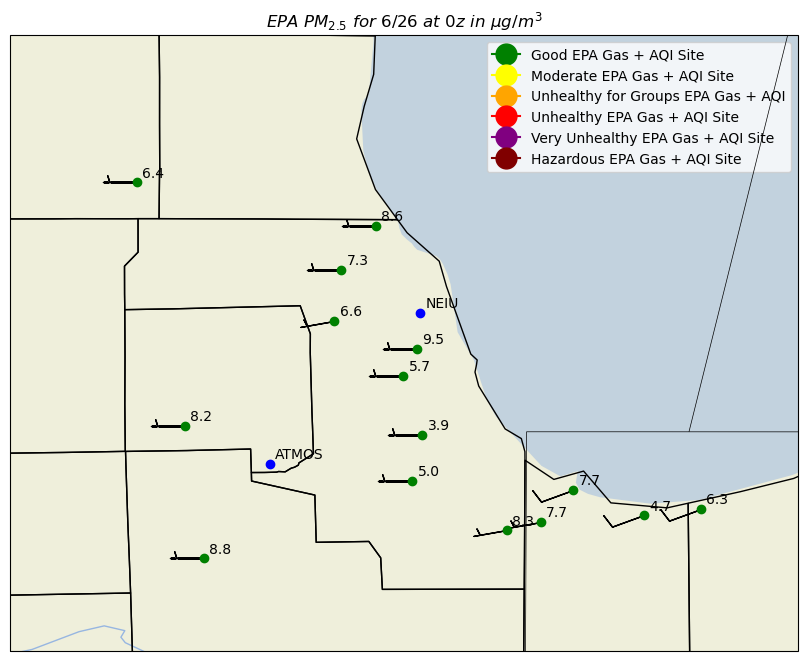

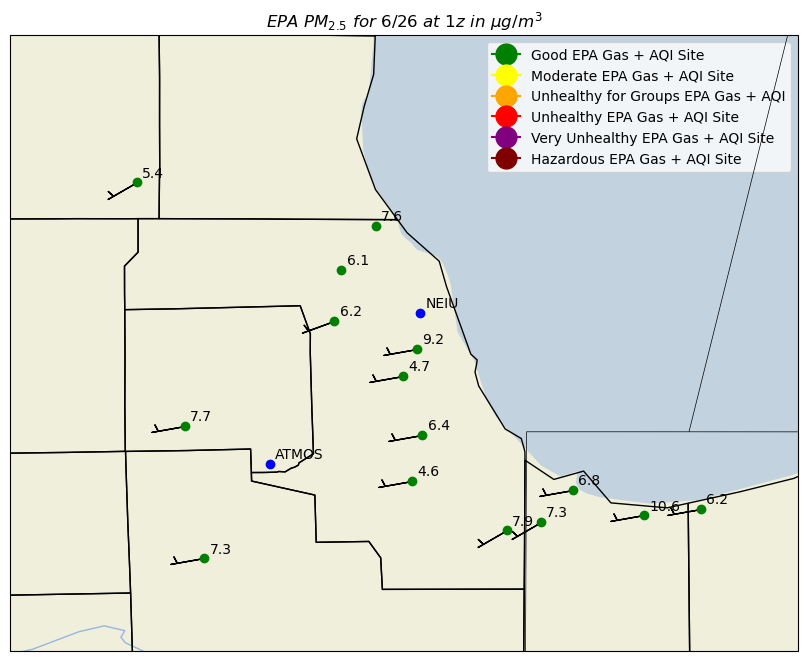

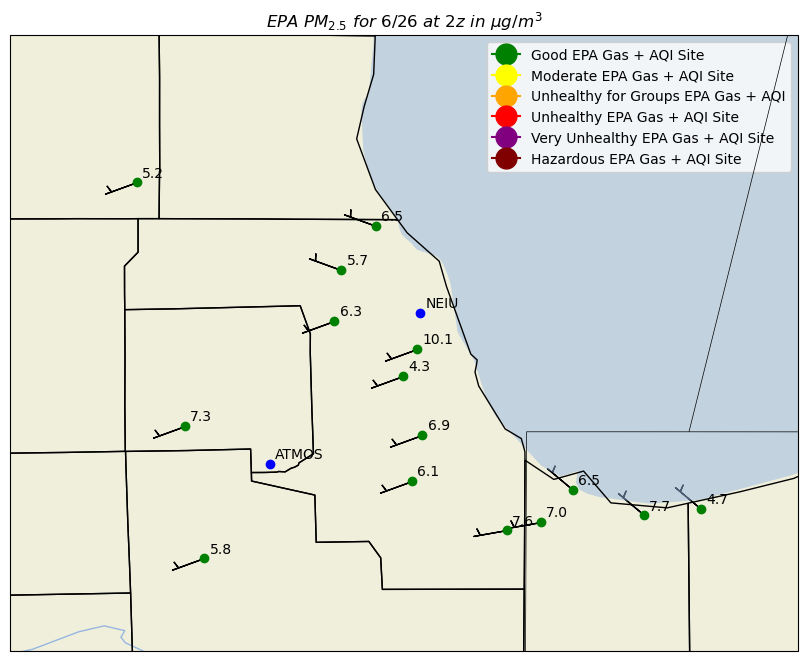

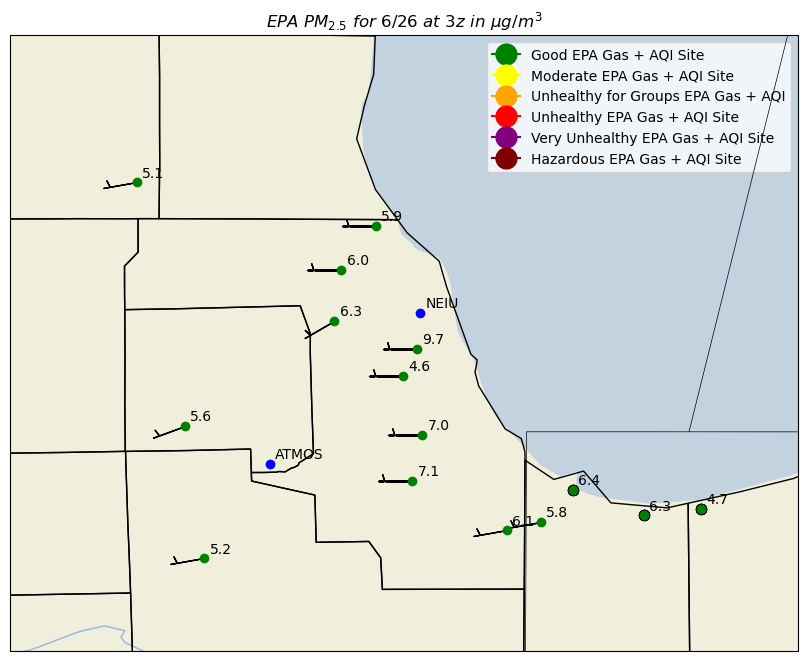

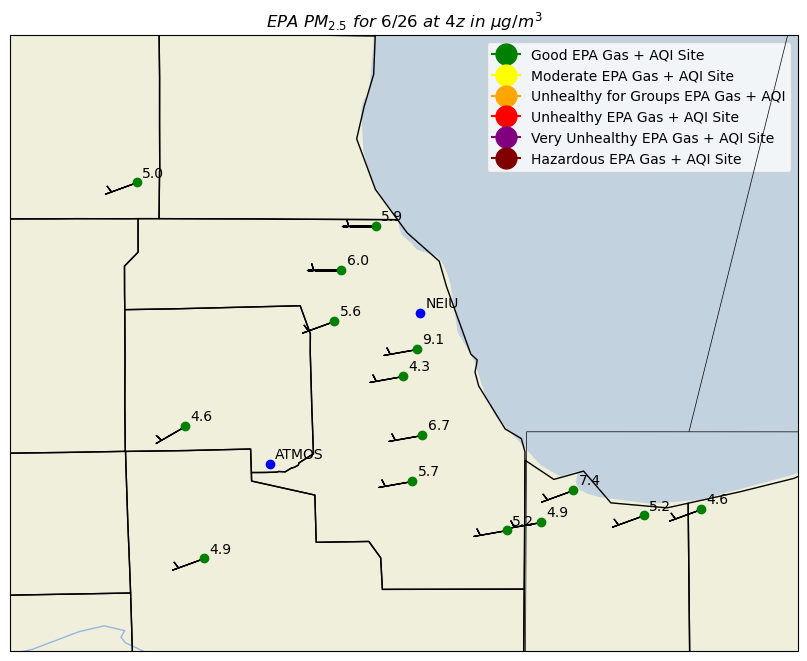

...

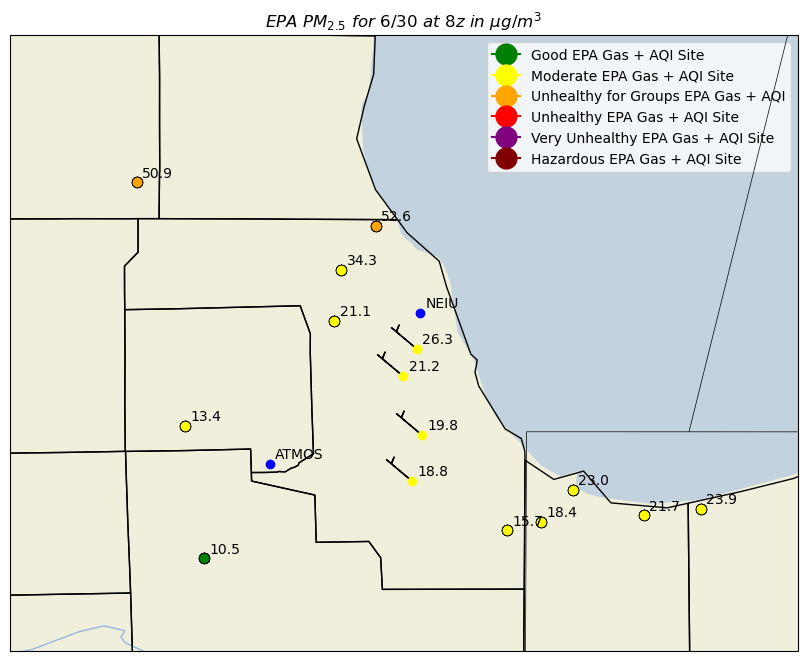

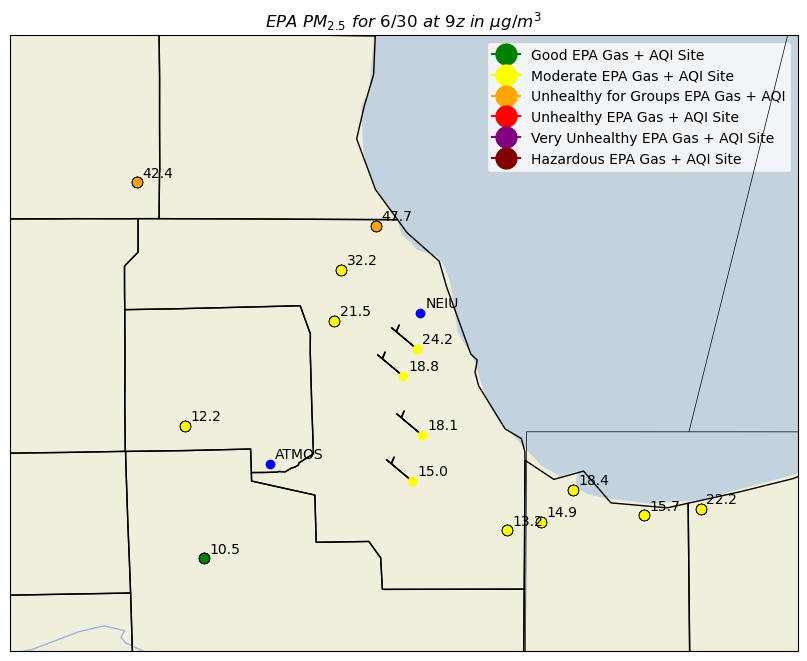

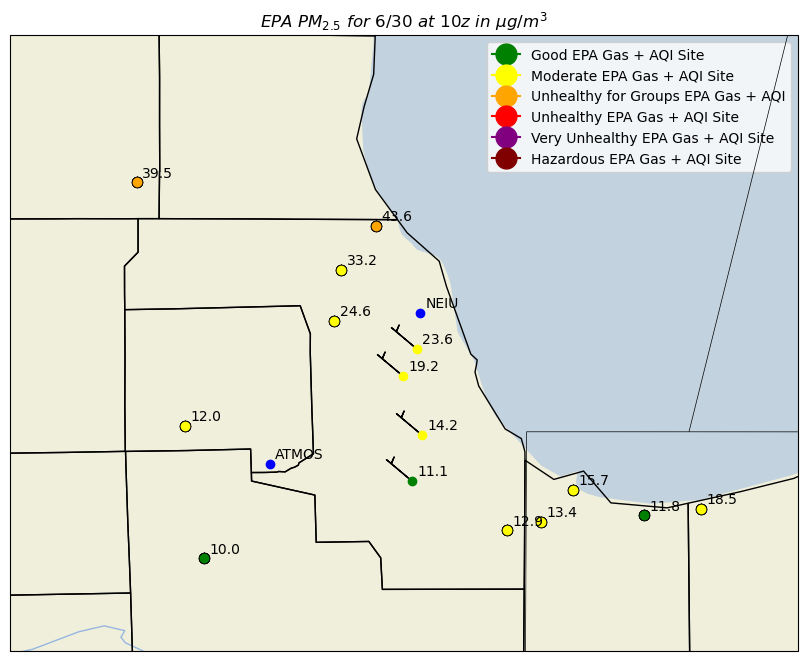

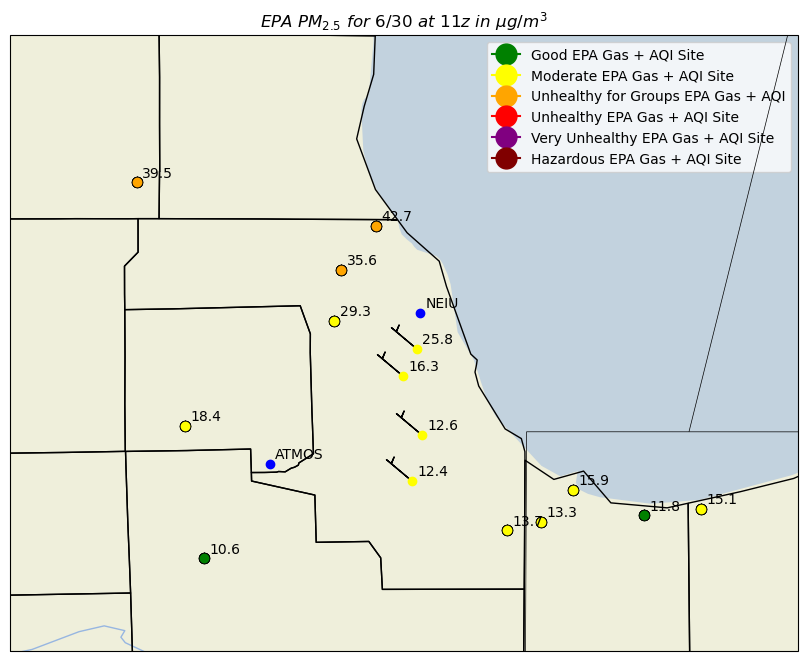

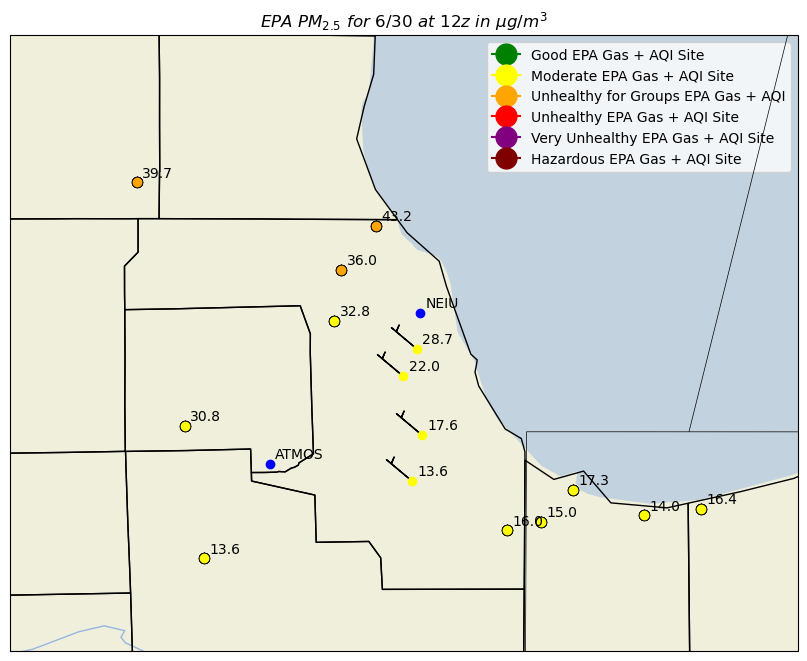

In [10]:
## Creating 24 time figures to show PM2.5 throughout the day on 6/26 and 6/27
for i in range(0,109):
    plt.figure(figsize=(15,8))
    ax = plt.axes(projection=ccrs.PlateCarree());
    ax.add_feature(cfeature.LAND)
    ax.add_feature(cfeature.OCEAN);
    ax.add_feature(cfeature.LAKES, alpha=0.5)
    ax.add_feature(cfeature.RIVERS);
    ax.add_feature(cfeature.BORDERS, linestyle=':');
    ax.coastlines(color='gray',resolution='110m');
    ax.set_extent([-88.474769, -87.020042, 41.356063,42.493302])
    states_provinces = cfeature.NaturalEarthFeature(
            category='cultural',  name='admin_1_states_provinces_lines',
            scale='50m', linewidth=0.5, facecolor='none')

    ax.add_feature(states_provinces, zorder=10);

    longitude = np.array(results.longitude)
    latitude = np.array(results.latitude)
    time = np.array(results.time)
    pm25 = np.array(results["PM2.5"])
    for j in range(len(results.longitude)):
        station = clostestStation[j]
        timeIndex = (times[station])[i]
        if (pm25[i][j] < 12):
            ax.plot(longitude[j], latitude[j], color="Green", marker="o", transform=ccrs.PlateCarree())
            ax.text(longitude[j] + 0.01, latitude[j] + 0.01, pm25[i][j], color="Black", transform=ccrs.PlateCarree())
            ax.barbs(longitude[j], latitude[j], (my_asoses[station].u.values)[timeIndex], (my_asoses[station].v.values)[timeIndex], transform=ccrs.PlateCarree())
        elif (pm25[i][j] < 35.4):
            ax.plot(longitude[j], latitude[j], color="Yellow", marker="o", transform=ccrs.PlateCarree())
            ax.text(longitude[j] + 0.01, latitude[j] + 0.01, pm25[i][j], color="Black", transform=ccrs.PlateCarree())
            ax.barbs(longitude[j], latitude[j], (my_asoses[station].u.values)[timeIndex], (my_asoses[station].v.values)[timeIndex], transform=ccrs.PlateCarree())
        elif (pm25[i][j] < 55.4):
            ax.plot(longitude[j], latitude[j], color="Orange", marker="o", transform=ccrs.PlateCarree())
            ax.text(longitude[j] + 0.01, latitude[j] + 0.01, pm25[i][j], color="Black", transform=ccrs.PlateCarree())
            ax.barbs(longitude[j], latitude[j], (my_asoses[station].u.values)[timeIndex], (my_asoses[station].v.values)[timeIndex], transform=ccrs.PlateCarree())
        elif (pm25[i][j] < 150.4):
            ax.plot(longitude[j], latitude[j], color="Red", marker="o", transform=ccrs.PlateCarree())
            ax.text(longitude[j] + 0.01, latitude[j] + 0.01, pm25[i][j], color="Black", transform=ccrs.PlateCarree())
            ax.barbs(longitude[j], latitude[j], (my_asoses[station].u.values)[timeIndex], (my_asoses[station].v.values)[timeIndex], transform=ccrs.PlateCarree())
        elif (pm25[i][j] < 250.4):
            ax.plot(longitude[j], latitude[j], color="Purple", marker="o", transform=ccrs.PlateCarree())
            ax.text(longitude[j] + 0.01, latitude[j] + 0.01, pm25[i][j], color="Black", transform=ccrs.PlateCarree())
            ax.barbs(longitude[j], latitude[j], (my_asoses[station].u.values)[timeIndex], (my_asoses[station].v.values)[timeIndex], transform=ccrs.PlateCarree())
        elif (pm25[i][j] >= 250.4):
            ax.plot(longitude[j], latitude[j], color="Magenta", marker="o", transform=ccrs.PlateCarree())
            ax.text(longitude[j] + 0.01, latitude[j] + 0.01, pm25[i][j], color="Black", transform=ccrs.PlateCarree())
            ax.barbs(longitude[j], latitude[j], (my_asoses[station].u.values)[timeIndex], (my_asoses[station].v.values)[timeIndex], transform=ccrs.PlateCarree())
        else:
            continue
    ax.add_feature(USCOUNTIES)
    WAGGLE_SITES = {'NEIU'  : [41.980289109, -87.71703552],
                'ATMOS' : [41.701605152, -87.995196552]
                   }
    green_circle = mlines.Line2D([], [], color='green', marker='o',
                          markersize=15, label='Good EPA Gas + AQI Site')
    yellow_circle = mlines.Line2D([], [], color='yellow', marker='o',
                          markersize=15, label='Moderate EPA Gas + AQI Site')
    orange_circle = mlines.Line2D([], [], color='orange', marker='o',
                          markersize=15, label='Unhealthy for Groups EPA Gas + AQI')
    red_circle = mlines.Line2D([], [], color='red', marker='o',
                          markersize=15, label='Unhealthy EPA Gas + AQI Site')
    purple_circle = mlines.Line2D([], [], color='purple', marker='o',
                          markersize=15, label='Very Unhealthy EPA Gas + AQI Site')
    maroon_circle = mlines.Line2D([], [], color='maroon', marker='o',
                          markersize=15, label='Hazardous EPA Gas + AQI Site')
    ax.legend(handles=[green_circle, yellow_circle, orange_circle,red_circle,purple_circle,maroon_circle])
    ax.plot(WAGGLE_SITES["ATMOS"][1], WAGGLE_SITES["ATMOS"][0], color="Blue", marker="o", transform=ccrs.PlateCarree())
    ax.text(WAGGLE_SITES["ATMOS"][1]+0.01, WAGGLE_SITES["ATMOS"][0]+0.01, "ATMOS", color="Black", transform=ccrs.PlateCarree())
    ax.plot(WAGGLE_SITES["NEIU"][1], WAGGLE_SITES["NEIU"][0], color="Blue", marker="o", transform=ccrs.PlateCarree())
    ax.text(WAGGLE_SITES["NEIU"][1]+0.01, WAGGLE_SITES["NEIU"][0]+0.01, "NEIU", color="Black", transform=ccrs.PlateCarree())
    if (i < 24):
        plt.title("$EPA\ PM_{2.5}\ for\ 6/26\ at\ %dz\ in\ \mu g/m^3$" %i)
        plt.savefig("PM25_EPA_626_%dz" % i)
    elif (i < 48):
        plt.title("$EPA\ PM_{2.5}\ for\ 6/27\ at\ %dz\ in\ \mu g/m^3$" % (i-24))
        plt.savefig("PM25_EPA_627%dz" % (i-24))
    elif (i < 72):
        plt.title("$EPA\ PM_{2.5}\ for\ 6/28\ at\ %dz\ in\ \mu g/m^3$" % (i-48))
        plt.savefig("PM25_EPA_628%dz" % (i-48))
    elif (i < 96):
        plt.title("$EPA\ PM_{2.5}\ for\ 6/29\ at\ %dz\ in\ \mu g/m^3$" % (i-72))
        plt.savefig("PM25_EPA_629_%dz" % (i-72))
    else:
        plt.title("$EPA\ PM_{2.5}\ for\ 6/30\ at\ %dz\ in\ \mu g/m^3$" %(i-96))
        plt.savefig("PM25_EPA_630_%dz" %(i-96))

In [11]:
frames = []
for i in range(0,109):
    if (i < 24):
        image = imageio.v2.imread("PM25_EPA_626_%dz.png" % i)
        frames.append(image)
    elif (i < 48):
        image = imageio.v2.imread("PM25_EPA_627%dz.png" % (i-24))
        frames.append(image)
    elif (i < 72):
        image = imageio.v2.imread("PM25_EPA_628%dz.png" % (i-48))
        frames.append(image)
    elif (i < 96):
        image = imageio.v2.imread("PM25_EPA_629_%dz.png" % (i-72))
        frames.append(image)
    else:
        image = imageio.v2.imread("PM25_EPA_630_%dz.png" % (i-96))
        frames.append(image)
imageio.mimsave('./PM25_626.gif', # output gif
                frames,          # array of input frames
                duration = 1000) 